In [1]:
!gdown -O facenet-data.zip https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
!unzip -d facenet-data facenet-data.zip

Downloading...
From: https://drive.google.com/uc?id=1kCQxmbJzZPyoyt10H4QAqAUZFhqNZuZG
To: /home/jovyan/work/facenet-data.zip
100%|████████████████████████████████████████| 496M/496M [00:43<00:00, 11.4MB/s]
Archive:  facenet-data.zip
   creating: facenet-data/subset/
 extracting: facenet-data/subset/Fred_Eckhard_1.npz  
 extracting: facenet-data/subset/Kevin_Spacey_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_2.npz  
 extracting: facenet-data/subset/Barbara_Brezigar_2.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_2.npz  
 extracting: facenet-data/subset/Kevin_Spacey_2.npz  
 extracting: facenet-data/subset/Fred_Eckhard_2.npz  
 extracting: facenet-data/subset/Lauren_Hutton_3.npz  
 extracting: facenet-data/subset/Amanda_Beard_0.npz  
 extracting: facenet-data/subset/Daniel_Kurtzer_1.npz  
 extracting: facenet-data/subset/Alison_Lohman_5.npz  
 extracting: facenet-data/subset/Andrew_Bernard_2.npz  
 extracting: facenet-data/subset/Robert_F_Kennedy_Jr_0.npz  
 extracting:

In [2]:
#data_dir = '/kaggle/temp/youtube-faces-with-facial-keypoints'
#data_dir = '/kaggle/input/faceid-preprocessed'
data_dir = 'facenet-data/subset'

In [3]:
import pandas as pd
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import os

In [4]:
import torch
import torchvision

In [5]:
df = pd.read_csv(f'{data_dir}/youtube_faces_with_keypoints_full.csv')
df

,videoID,personName,imageHeight,imageWidth,videoDuration,averageFaceSize,numVideosForPerson
0,Alison_Lohman_0,Alison_Lohman,228.0,213.0,240.0,90.150000,6.0
1,Alison_Lohman_1,Alison_Lohman,248.0,201.0,79.0,108.417722,6.0
2,Alison_Lohman_2,Alison_Lohman,335.0,308.0,136.0,122.161765,6.0
3,Alison_Lohman_3,Alison_Lohman,151.0,110.0,53.0,58.000000,6.0
4,Alison_Lohman_4,Alison_Lohman,236.0,228.0,147.0,91.680272,6.0
5,Alison_Lohman_5,Alison_Lohman,227.0,179.0,68.0,105.647059,6.0
6,Kevin_Spacey_0,Kevin_Spacey,196.0,264.0,91.0,99.912088,6.0
7,Kevin_Spacey_1,Kevin_Spacey,260.0,217.0,59.0,120.186441,6.0
8,Kevin_Spacey_2,Kevin_Spacey,186.0,175.0,71.0,86.746479,6.0
9,Kevin_Spacey_3,Kevin_Spacey,100.0,89.0,99.0,44.636364,6.0


In [6]:
import facenet_pytorch

class MtcnnTransform:
    def __init__(self):
        self.mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)
        self.to_pil = torchvision.transforms.ToPILImage()
        
    def __call__(self, img, lms):
        return self.mtcnn(self.to_pil(img))

In [7]:
import PIL

class ResizeTransform:
    def __init__(self):
        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

In [8]:
import PIL
import cv2

class NormalizeTransform:
    def __init__(self, ratio=0.333):
        self.ratio = ratio

        self.jawPoints          = [ 0,17]
        self.rigthEyebrowPoints = [17,22]
        self.leftEyebrowPoints  = [22,27]
        self.noseRidgePoints    = [27,31]
        self.noseBasePoints     = [31,36]
        self.rightEyePoints     = [36,42]
        self.leftEyePoints      = [42,48]
        self.outerMouthPoints   = [48,60]
        self.innerMouthPoints   = [60,68]

        self.norm_transform = torchvision.transforms.Compose([
            torchvision.transforms.Resize((224, 224)),
            torchvision.transforms.ToTensor(),
        ])

    def __call__(self, data, landmarks):
        data = self.face_transform(data, landmarks)
        img = PIL.Image.fromarray(data)
        data = self.norm_transform(img)
        return data

    def face_transform(self, data, landmarks):
        # see FaceId-Normalization.ipynb
        pt1 = self.avg(landmarks[self.leftEyePoints[0]:self.leftEyePoints[1]])
        pt2 = self.avg(landmarks[self.outerMouthPoints[0]:self.outerMouthPoints[1]])
        pt3 = self.avg(landmarks[self.rightEyePoints[0]:self.rightEyePoints[1]])
        src_pts = np.float32([pt1, pt2, pt3])
        dst_pts = np.float32([
            [data.shape[0]*self.ratio, data.shape[1]*self.ratio],
            [data.shape[0]/2, data.shape[1]*(1-self.ratio)],
            [data.shape[0]*(1-self.ratio), data.shape[1]*self.ratio]
        ])
        M = cv2.getAffineTransform(src_pts, dst_pts)
        data = cv2.warpAffine(data, M, data.shape[:2])
        return data
    
    def avg(self, pts):
        x = sum(x for x,y in pts) / len(pts)
        y = sum(y for x,y in pts) / len(pts)
        return x, y

In [9]:
import random
import pickle

random.seed()

class YouTubeFacesDataset(torch.utils.data.Dataset):
    def __init__(self, df, folder = '.', transform = MtcnnTransform(),
                 cache_lim = 200,
                 preload = False, preprocess = False,
                 anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1,
                 stochastic_set_fraction = 0.8):
        self.transform = transform
        self.cache = {}
        self.cache_lim = 0 if preload else cache_lim
        self.preprocessed_cache = {}
        self.data = {}
        for p in tqdm(df['personName'].unique(), desc='Loading data'):
            self.data[p] = []
            for fn, cnt in df[df['personName'] == p][['videoID', 'videoDuration']].values:
                fp = f'{folder}/{fn}.npz'
                cnt = int(cnt)
                self.data[p] += [(fp, i) for i in range(cnt)]
                if preload:
                    self.cache_lim += 1
                    imgs, lms = self._cache_get(fp)
                    assert imgs.shape[-1] == cnt
                    assert lms.shape[-1] == cnt
                if preprocess:
                    pfp = self._preprocess(fp)
                    imgs = self._load_preprocessed(pfp)
                    assert len(imgs) == cnt
                    self.preprocessed_cache[fp] = imgs
        self.persons = list(self.data.keys())
        self.neg_data = {}
        for p in self.persons:
            self.neg_data[p] = []
            for p_neg in self.persons:
                if p_neg == p:
                    continue
                self.neg_data[p] += self.data[p_neg]
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def resize(self, anchor_set_len = 1, positive_set_len = 1, negative_set_len = 1, stochastic_set_fraction = 0.8):
        self.anchor_set_len = anchor_set_len
        self.positive_set_len = positive_set_len
        self.negative_set_len = negative_set_len
        self.stochastic_set_fraction = stochastic_set_fraction
    
    def __len__(self):
        return len(self.persons) * self.anchor_set_len * self.positive_set_len * self.negative_set_len
    
    def __getitem__(self, index):
        p_i = index // self.negative_set_len // self.positive_set_len // self.anchor_set_len
        assert p_i >= 0
        assert p_i < len(self.persons)
        p = self.persons[p_i]
        if self.negative_set_len > len(self.neg_data[p]) * self.stochastic_set_fraction:
            negative_i = index % self.negative_set_len
            negative_i = negative_i % len(self.neg_data[p])
        else:
            negative_i = random.randint(0, len(self.neg_data[p]) - 1)
        assert negative_i >= 0
        assert negative_i < len(self.neg_data[p])
        if self.positive_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            positive_i = (index // self.negative_set_len) % self.positive_set_len
            positive_i = positive_i % len(self.data[p])
        else:
            positive_i = random.randint(0, len(self.data[p]) - 1)
        assert positive_i >= 0
        assert positive_i < len(self.data[p])
        if self.anchor_set_len > len(self.data[p]) * self.stochastic_set_fraction:
            anchor_i = (index // self.negative_set_len // self.positive_set_len) % self.anchor_set_len
            anchor_i = anchor_i % len(self.data[p])
        else:
            anchor_i = random.randint(0, len(self.data[p]) - 1)
        assert anchor_i >= 0
        assert anchor_i < len(self.data[p])
        return self._load(*self.data[p][anchor_i]), self._load(*self.data[p][positive_i]), self._load(*self.neg_data[p][negative_i])
    
    def _load(self, fp, i):
        if fp in self.preprocessed_cache:
            assert i < len(self.preprocessed_cache[fp]), (fp, i, len(self.preprocessed_cache[fp]))
            if self.preprocessed_cache[fp][i] is not None:
                return self.preprocessed_cache[fp][i]
        imgs, lms = self._cache_get(fp)
        assert i < imgs.shape[-1], (fp, i, imgs.shape[-1])
        data = imgs[:,:,:,i]
        assert i < lms.shape[-1], (fp, i, lms.shape[-1])
        lms = lms[:,:,i]
        if self.transform:
            data = self.transform(data, lms)
        return data
    
    def _cache_get(self, fp):
        if fp in self.cache:
            return self.cache[fp]
        if len(self.cache) > self.cache_lim:
            idx = random.randint(0, len(self.cache) - 1)
            key = list(self.cache.keys())[idx]
            del self.cache[key]
        d = np.load(fp)
        # trigger lazy loading
        self.cache[fp] = (d['colorImages'], d['landmarks2D'])
        return self.cache[fp]
    
    def _preprocess(self, fp):
        pfp = f'{fp}.pkl'
        if not os.path.exists(pfp):
            imgs, lms = self._cache_get(fp)
            d = [self._load(fp, i) for i in range(imgs.shape[-1])]
            with open(pfp, 'wb') as f:
                pickle.dump(d, f)
        return pfp
    
    def _load_preprocessed(self, pfp):
        with open(pfp, 'rb') as f:
            return pickle.load(f)

dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=None)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 126.10it/s]


10

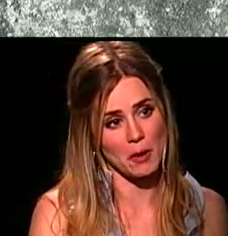

In [10]:
to_pil = torchvision.transforms.ToPILImage()
to_pil(dataset[0][0])

In [11]:
mtcnn = facenet_pytorch.MTCNN(image_size=224, margin=0)

In [12]:
dataset.resize(1000, 1000, 1000)
len(dataset)

10000000000

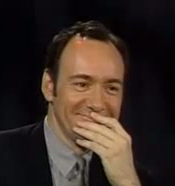

In [13]:
img = to_pil(dataset[1200000000][0])
img

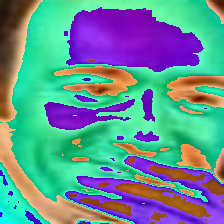

In [14]:
img_face = mtcnn(img)
to_pil(img_face)

In [15]:
facenet = facenet_pytorch.InceptionResnetV1(pretrained='vggface2').eval()

In [16]:
from torchinfo import summary
summary(facenet, (1, 3, 224, 224))

Layer (type:depth-idx)                        Output Shape              Param #
InceptionResnetV1                             [1, 512]                  4,427,703
├─BasicConv2d: 1-1                            [1, 32, 111, 111]         --
│    └─Conv2d: 2-1                            [1, 32, 111, 111]         864
│    └─BatchNorm2d: 2-2                       [1, 32, 111, 111]         64
│    └─ReLU: 2-3                              [1, 32, 111, 111]         --
├─BasicConv2d: 1-2                            [1, 32, 109, 109]         --
│    └─Conv2d: 2-4                            [1, 32, 109, 109]         9,216
│    └─BatchNorm2d: 2-5                       [1, 32, 109, 109]         64
│    └─ReLU: 2-6                              [1, 32, 109, 109]         --
├─BasicConv2d: 1-3                            [1, 64, 109, 109]         --
│    └─Conv2d: 2-7                            [1, 64, 109, 109]         18,432
│    └─BatchNorm2d: 2-8                       [1, 64, 109, 109]         128
│   

In [17]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1)
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 256.76it/s]


10

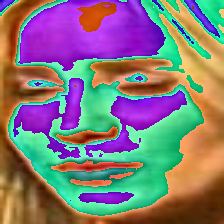

In [18]:
to_pil(dataset[0][0])

In [19]:
v = facenet(dataset[0][0].reshape(1, 3, 224, 224)).detach().numpy()
v.shape

(1, 512)

In [20]:
v

array([[-1.42137446e-02, -2.85578445e-02,  1.87121853e-02,
        -1.40896849e-02, -1.16468617e-03,  2.72294674e-02,
        -2.71660928e-02, -6.56916201e-02,  8.39057267e-02,
         6.54267594e-02, -3.62015627e-02,  1.69368144e-02,
        -2.16701138e-03, -1.57661969e-03, -2.13314649e-02,
        -1.07815359e-02,  9.54059958e-02,  6.28252625e-02,
         8.78868811e-03,  2.09190957e-02, -3.01116873e-02,
        -5.36731221e-02,  6.33165464e-02,  1.16891395e-02,
        -4.66725975e-02,  5.56569733e-03, -8.87311623e-02,
         3.22295688e-02, -5.83860427e-02,  2.35736426e-02,
        -4.77033220e-02, -1.16144288e-02, -1.21094011e-01,
        -9.44771320e-02, -2.86260503e-03, -1.43355494e-02,
        -1.33023765e-02, -8.81347954e-02, -5.25581837e-02,
         3.02267205e-02, -2.19612624e-02,  4.14080732e-02,
        -8.94453898e-02,  4.41542305e-02,  5.13731353e-02,
        -8.26855469e-03,  8.71779397e-02, -3.31489107e-04,
         1.65357757e-02, -3.17172408e-02, -2.54453486e-0

In [21]:
def cos_similarity(v1, v2):
    val = np.inner(v1,v2)/(np.linalg.norm(v1)*np.linalg.norm(v2))
    return val.reshape(-1)[0]

def euc_similarity(v1, v2):
    return np.linalg.norm(v1-v2)

In [22]:
def validate(model, dataset, cnt = 20):
    _, axs = plt.subplots(nrows=cnt, ncols=3, figsize=(3*4, cnt*4))
    for i in range(cnt):
        idx = random.randint(0, len(dataset)-1)
        img1, img2, img3 = dataset[idx]
        v1 = model(img1.reshape(1, 3, 224, 224)).detach().numpy()
        v2 = model(img2.reshape(1, 3, 224, 224)).detach().numpy()
        v3 = model(img3.reshape(1, 3, 224, 224)).detach().numpy()
        title = '%d %f %f %f %f %f %f' % (idx,
            euc_similarity(v1, v2), euc_similarity(v1, v3),
            cos_similarity(v1, v2), cos_similarity(v1, v3),
            np.vstack((v1, v2, v3)).min(), np.vstack((v1, v2, v3)).max())
        plt.sca(axs[i, 0])
        plt.imshow(to_pil(img1))
        plt.axis('off')
        plt.sca(axs[i, 1])
        plt.imshow(to_pil(img2))
        plt.axis('off')
        plt.title(title)
        plt.sca(axs[i, 2])
        plt.imshow(to_pil(img3))
        plt.axis('off')
        print(title)

1 0.863107 1.485772 0.627523 -0.103759 -0.136194 0.133076
7 1.027807 1.211301 0.471806 0.266376 -0.141054 0.147142
7 0.646221 1.380255 0.791199 0.047448 -0.140471 0.159352
5 0.750540 1.291423 0.718345 0.166113 -0.134740 0.137104
1 0.398323 1.235212 0.920669 0.237126 -0.141535 0.145499
9 0.247956 1.482879 0.969259 -0.099465 -0.141970 0.136530
6 0.575983 1.582646 0.834122 -0.252385 -0.142228 0.148551
5 0.686040 1.284913 0.764675 0.174500 -0.145184 0.127091
7 0.924388 1.611404 0.572753 -0.298312 -0.163716 0.145635
3 0.409941 1.087829 0.915974 0.408314 -0.153285 0.121083
1 0.185351 1.427293 0.982823 -0.018582 -0.142216 0.116942
1 0.231606 1.257883 0.973180 0.208866 -0.149496 0.124242
1 0.520761 1.361444 0.864404 0.073235 -0.122994 0.130310
1 0.754780 1.201468 0.715154 0.278237 -0.173056 0.137231
6 0.722185 1.244447 0.739225 0.225675 -0.128065 0.130826
8 0.670207 1.411318 0.775411 0.004090 -0.127623 0.157627
2 0.651022 1.294176 0.788085 0.162555 -0.132399 0.134804
3 0.455066 1.456531 0.8964

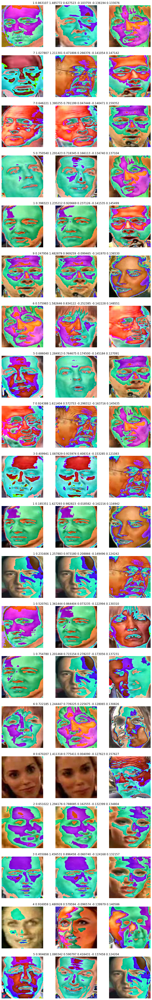

In [23]:
validate(facenet, dataset)

---

In [24]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=ResizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 279.73it/s]


10

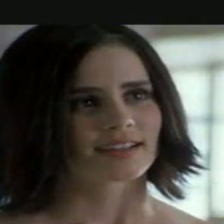

In [25]:
to_pil(dataset[0][0])

0 0.870928 1.281830 0.620742 0.178456 -0.129999 0.147319
7 0.228327 1.493008 0.973933 -0.114536 -0.149298 0.140945
3 0.858233 1.243020 0.631719 0.227450 -0.137748 0.134668
7 0.770909 1.421247 0.702850 -0.009971 -0.146498 0.131296
1 0.725174 1.321815 0.737062 0.126403 -0.128069 0.138655
7 0.936237 1.114154 0.561730 0.379331 -0.157620 0.122049
4 0.345878 1.404660 0.940184 0.013465 -0.123444 0.150529
1 0.399146 0.929434 0.920341 0.568076 -0.132377 0.133466
1 0.744280 1.052173 0.723024 0.446466 -0.127005 0.141600
5 0.738043 1.121084 0.727646 0.371586 -0.136929 0.142287
5 0.663008 1.184378 0.780211 0.298625 -0.134171 0.145381
1 0.782781 0.930157 0.693627 0.567403 -0.126302 0.144210
6 0.516796 1.243181 0.866461 0.227250 -0.129714 0.125946
0 0.794492 1.360491 0.684391 0.074531 -0.127348 0.160683
3 0.731075 1.395686 0.732765 0.026030 -0.143779 0.128787
0 0.751956 1.436189 0.717281 -0.031319 -0.158067 0.141603
0 0.798227 1.370849 0.681417 0.060386 -0.144430 0.147619
4 0.916192 1.488962 0.580296

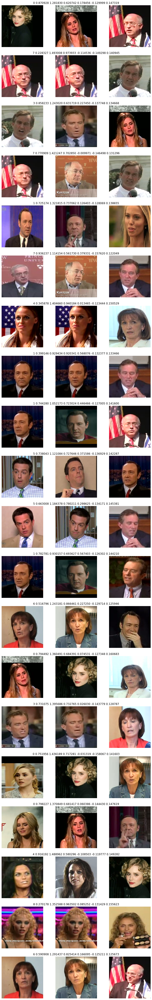

In [26]:
validate(facenet, dataset)

---

In [27]:
dataset = YouTubeFacesDataset(df, data_dir, cache_lim = 1, transform=NormalizeTransform())
len(dataset)

Loading data: 100%|██████████| 10/10 [00:00<00:00, 263.50it/s]


10

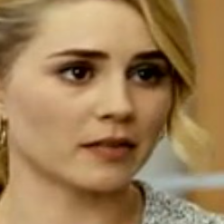

In [28]:
to_pil(dataset[0][0])

8 1.144329 1.367866 0.345255 0.064471 -0.131598 0.142633
1 0.546323 1.194637 0.850765 0.286421 -0.158860 0.157526
3 0.849198 0.855283 0.639432 0.634246 -0.132615 0.121658
5 0.399073 1.430044 0.920371 -0.022513 -0.134280 0.142486
6 0.356389 1.495744 0.936493 -0.118625 -0.161064 0.144310
2 0.922086 1.352659 0.574879 0.085157 -0.130176 0.129959
5 0.828885 1.098259 0.656475 0.396913 -0.135129 0.137191
4 0.992066 1.132291 0.507903 0.358958 -0.115983 0.121199
3 0.623162 0.986990 0.805835 0.512925 -0.146857 0.146488
3 0.704921 1.261571 0.751543 0.204219 -0.142059 0.117958
8 0.454298 1.129598 0.896807 0.362004 -0.133491 0.140695
0 0.933713 1.466685 0.564090 -0.075583 -0.136818 0.135378
0 0.779259 1.547367 0.696378 -0.197173 -0.167878 0.123261
0 1.000059 1.343694 0.499941 0.097243 -0.134549 0.156123
8 1.107598 1.152588 0.386613 0.335770 -0.174301 0.158756
3 0.699294 1.297462 0.755494 0.158296 -0.139312 0.133290
0 1.013712 1.333946 0.486194 0.110294 -0.146489 0.149475
1 0.586904 1.055967 0.82777

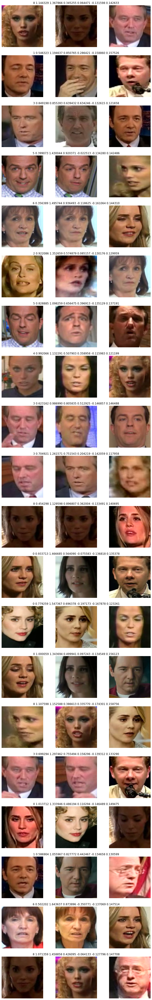

In [29]:
validate(facenet, dataset)

---